In [1]:
import os
os.environ['USE_PYGEOS'] = '0'

import numpy as np
import pandas as pd
import xarray as xr

import dask

import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial' 
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams["axes.linewidth"] = 1.50

from matplotlib.colors import LinearSegmentedColormap
cm_data = np.loadtxt("../../ScientificColourMaps7/batlow/batlow.txt")[::-1]
batlow_map = LinearSegmentedColormap.from_list('batlow', cm_data)

cm_data = np.loadtxt("../../ScientificColourMaps7/bamako/bamako.txt")[::-1]
bamako_map = LinearSegmentedColormap.from_list('bamako', cm_data)

import cartopy.crs as ccrs
import regionmask

### Preliminaries

In [2]:
###############################
# Set paths
# UPDATE THIS FOR REPRODUCTION
###############################
path_in = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/results/'
data_path = '/storage/home/dcl5300/work/lafferty-sriver_inprep_tbd/figs/data/'

nex_in = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/metrics/nex-gddp/'
cil_in = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/metrics/cil-gdpcir/'
isi_in = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/metrics/isimip3b/regridded/conservative/'
cbp_in = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/metrics/carbonplan/'

poly_path = '/gpfs/group/kaf26/default/dcl5300/lafferty-sriver_inprep_tbh_DATA/forced_response_polynomial/'

In [3]:
###################
# Models
###################
from utils import nex_ssp_dict, cil_ssp_dict, isimip_ssp_dict, gardsv_ssp_dict, gardsv_var_dict, deepsdbc_dict

nex_models = list(nex_ssp_dict.keys())
cil_models = list(cil_ssp_dict.keys())
isi_models = list(isimip_ssp_dict.keys())
cbp_gard_models = list(gardsv_ssp_dict.keys())
cbp_gard_precip_models = [model for model in cbp_gard_models if 'pr' in gardsv_var_dict[model]]
cbp_deep_models = list(deepsdbc_dict.keys())

In [13]:
###################
# Dask (if needed)
###################
from dask_jobqueue import PBSCluster

cluster = PBSCluster(cores=1, memory='15GB', resource_spec='pmem=15GB',
                     worker_extra_args=['#PBS -l feature=rhel7'], 
                     walltime='00:20:00')

cluster.scale(jobs=10)  # ask for jobs

from dask.distributed import Client
client = Client(cluster)

client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.102.201.236:45541,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [4]:
##############################
# UC map plot
##############################
def plot_map(metric, var_id, const_iav, deg, scenario_id, axs, fig, cbar, title):
    # Setup read paths
        uc_read_path = path_in + 'uc/' + metric + '_deg' + str(deg)
        iav_read_path = path_in + 'uc/' + metric + '_deg' + str(deg)
        if const_iav:
            iav_read_path += '_const_iav.nc'
        else:
            iav_read_path += '_nonconst_iav.nc'
        
    if metric in ['hot', 'wet', 'hotdry']:
        var_id_string = var_id.replace('_count', '').replace('_streak', '')
        iav_read_path = iav_read_path.replace(metric, metric + '_' + var_id_string)
    
    # Averaging periods
    early_start, early_end = 2020, 2039
    mid_start, mid_end = 2050, 2069
    late_start, late_end = 2080, 2099
    
    # Read
    ds_uc = xr.open_dataset(uc_read_path)
    ds_iav = xr.open_dataset(iav_read_path)
        if const_iav:
            ds_iav_early = ds_iav.expand_dims(dim={'time':np.arange(early_start,early_end+1)}).assign_coords(uncertainty = 'variability')
            ds_iav_mid = ds_iav.expand_dims(dim={'time':np.arange(mid_start,mid_end+1)}).assign_coords(uncertainty = 'variability')
            ds_iav_late = ds_iav.expand_dims(dim={'time':np.arange(late_start,late_end+1)}).assign_coords(uncertainty = 'variability')
        else:
            ds_iav_early = ds_iav.sel(time='early').expand_dims(dim={'time':np.arange(early_start,early_end+1)}).assign_coords(uncertainty = 'variability')
            ds_iav_mid = ds_iav.sel(time='mid').expand_dims(dim={'time':np.arange(mid_start,mid_end+1)}).assign_coords(uncertainty = 'variability')
            ds_iav_late = ds_iav.sel(time='late').expand_dims(dim={'time':np.arange(late_start,late_end+1)}).assign_coords(uncertainty = 'variability')
            
    # Concat and resample to 3 epochs
    ds_early = xr.concat([ds_iav_early, ds_uc.sel(time = slice(early_start, early_end))], dim='uncertainty')[var_id]
    ds_mid = xr.concat([ds_iav_mid, ds_uc.sel(time = slice(mid_start, mid_end))], dim='uncertainty')[var_id]
    ds_late = xr.concat([ds_iav_late, ds_uc.sel(time = slice(late_start, late_end))], dim='uncertainty')[var_id]

    # Get 'total' uncertainty
    scenario = 'scenario_' + scenario_id
    
    Utotal_early = ds_early.sel(uncertainty='model') + ds_early.sel(uncertainty=scenario) + ds_early.sel(uncertainty='ensemble') + ds_early.sel(uncertainty='variability')
    Utotal_mid = ds_mid.sel(uncertainty='model') + ds_mid.sel(uncertainty=scenario) + ds_mid.sel(uncertainty='ensemble') + ds_mid.sel(uncertainty='variability')
    Utotal_late = ds_late.sel(uncertainty='model') + ds_late.sel(uncertainty=scenario) + ds_late.sel(uncertainty='ensemble') + ds_late.sel(uncertainty='variability')

    # Get fractions and average for each epoch
    Ufrac_model_early = 100 * (ds_early.sel(uncertainty='model') / Utotal_early).mean(dim='time')
    Ufrac_scenario_early = 100 * (ds_early.sel(uncertainty=scenario) / Utotal_early).mean(dim='time')
    Ufrac_ensemble_early = 100  * (ds_early.sel(uncertainty='ensemble') / Utotal_early).mean(dim='time')
    Ufrac_iav_early = 100 * (ds_early.sel(uncertainty='variability') / Utotal_early).mean(dim='time')

    Ufrac_model_mid = 100 * (ds_mid.sel(uncertainty='model') / Utotal_mid).mean(dim='time')
    Ufrac_scenario_mid = 100 * (ds_mid.sel(uncertainty=scenario) / Utotal_mid).mean(dim='time')
    Ufrac_ensemble_mid = 100 * (ds_mid.sel(uncertainty='ensemble') / Utotal_mid).mean(dim='time')
    Ufrac_iav_mid = 100 * (ds_mid.sel(uncertainty='variability') / Utotal_mid).mean(dim='time')

    Ufrac_model_late = 100 * (ds_late.sel(uncertainty='model') / Utotal_late).mean(dim='time')
    Ufrac_scenario_late = 100 * (ds_late.sel(uncertainty=scenario) / Utotal_late).mean(dim='time')
    Ufrac_ensemble_late = 100 * (ds_late.sel(uncertainty='ensemble') / Utotal_late).mean(dim='time')
    Ufrac_iav_late = 100 * (ds_late.sel(uncertainty='variability') / Utotal_late).mean(dim='time')    
    
    # Plot
    cmap = bamako_map

    if fig == False:
        fig, axs = plt.subplots(ncols=4, nrows=3,
                                figsize=(16,6),
                                subplot_kw=dict(projection=ccrs.PlateCarree()))
        axs = axs.flatten()

        fig.subplots_adjust(bottom=0.2, top=0.9, left=0.1, right=0.9,
                            wspace=0.02, hspace=0.01)

    # List with all results
    Ufrac_all = [Ufrac_scenario_early, Ufrac_model_early, Ufrac_ensemble_early, Ufrac_iav_early,
                 Ufrac_scenario_mid, Ufrac_model_mid, Ufrac_ensemble_mid, Ufrac_iav_mid,
                 Ufrac_scenario_late, Ufrac_model_late, Ufrac_ensemble_late, Ufrac_iav_late]
    
    # Loop through and make each plot
    axs = axs.flatten()
    for i in range(len(axs)):
        ax=axs[i]
        p = Ufrac_all[i].plot(ax=ax,
                          transform=ccrs.PlateCarree(),
                          vmin=0., vmax=100.,# levels=11,
                          cmap=cmap, add_colorbar=False)
        ax.coastlines()
        ax.set_title('')
        ax.text(0.1, 0.17, "{:.0f}%".format(Ufrac_all[i].mean()),
                fontsize=10,
                horizontalalignment='center',
                verticalalignment='center',
                transform=ax.transAxes,
                bbox=dict(facecolor='silver', edgecolor='silver', alpha=0.5))

    # Set titles
    axs[0].set_title('Scenario uncertainty', fontsize=12)
    axs[1].set_title('Model uncertainty', fontsize=12)
    axs[2].set_title('Downscaling uncertainty', fontsize=12)
    axs[3].set_title('Inter-annual variability', fontsize=12)

    axs[0].text(-185, 15, '2020-2039', va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=12)
    axs[4].text(-185, 15, '2050-2069', va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=12)
    axs[8].text(-185, 15, '2080-2099', va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=12)

    # Single colorbar
    if cbar:
        cbar_ax = fig.add_axes([0.2, -0.04, 0.6, 0.02])

        cbar = fig.colorbar(p, cax=cbar_ax,
                            orientation='horizontal',
                            label='Fraction of total variance (%)')
    
    # Overall title
    if title:
        fig.set_title(title, fontsize=12, fontweight='bold', y=0.97)

In [10]:
##############################
# Regional UC plot over time
##############################
def plot_region_uc(metric, var_id, region, deg, scenario_id, title, ylabel, xlabel, legend, ax):
    """
    Region can either be a specific [lat, lon] or a IPCC AR6 region name. IAV must be assumed constant.
    """
    # Setup read paths
        uc_read_path = path_in + 'uc/' + metric + '_deg' + str(deg)
        iav_read_path = path_in + 'uc/' + metric + '_deg' + str(deg)
        if const_iav:
            iav_read_path += '_const_iav.nc'
        else:
            iav_read_path += '_nonconst_iav.nc'
        
    if metric in ['hot', 'wet', 'hotdry']:
        var_id_string = var_id.replace('_count', '').replace('_streak', '')
        iav_read_path = iav_read_path.replace(metric, metric + '_' + var_id_string)
    
    # Read
    ds_uc = xr.open_dataset(uc_read_path)[var_id]
    
    ds_iav = xr.open_dataset(iav_read_path)[var_id]
    ds_iav = ds_iav.expand_dims(dim={'time':np.arange(2015,2100)})
    ds_iav = ds_iav.assign_coords(uncertainty = 'variability')
        
    # Select region
    if type(region) == str:
        mask = regionmask.defined_regions.srex.mask(ds_uc)
        region_index = regionmask.defined_regions.ar6.land.map_keys(region)
        ds_uc_masked = ds_uc.where(mask == region_index, drop=True)
        ds_iav_masked = ds_iav.where(mask == region_index, drop=True)
    elif type(region) == list:
        ds_uc_masked = ds_uc.sel(lat=region[0], lon=region[1], method='nearest')
        ds_iav_masked = ds_iav.sel(lat=region[0], lon=region[1], method='nearest')
    
    # Get 'total' uncertainty
    scenario = 'scenario_' + scenario_id
    
    Utotal = ds_uc_masked.sel(uncertainty='model') + ds_uc_masked.sel(uncertainty=scenario) + ds_uc_masked.sel(uncertainty='ensemble') + ds_iav_masked
        
    # Get fractions and average for each epoch
    Ufrac_model = 100 * ds_uc_masked.sel(uncertainty='model') / Utotal
    Ufrac_scenario = 100 * ds_uc_masked.sel(uncertainty=scenario) / Utotal
    Ufrac_ensemble = 100 * ds_uc_masked.sel(uncertainty='ensemble') / Utotal
    Ufrac_iav = 100 * ds_iav_masked / Utotal
        
    # Average over region
    if type(region) == str:
        Ufrac_model = Ufrac_model.mean(dim=['lat','lon'])
        Ufrac_scenario = Ufrac_scenario.mean(dim=['lat','lon'])
        Ufrac_ensemble = Ufrac_ensemble.mean(dim=['lat','lon'])
        Ufrac_iav = Ufrac_iav.mean(dim=['lat','lon'])
    
    # Construct plotting dict
    uncert_dict = {
    'Scenario': Ufrac_scenario.to_numpy(),
    'Model': Ufrac_model.to_numpy(),
    'Downscaling': Ufrac_ensemble.to_numpy(),
    'Variability': Ufrac_iav.to_numpy()
    }
        
    # Make plot
    ax.stackplot(np.arange(2015, 2100),
                 uncert_dict.values(),
                 labels=uncert_dict.keys(),
                 alpha=1, colors=['#7fc97f', '#beaed4', '#fdc086', '#ffff99'],
                 edgecolor='white',
                 lw=1.5)

    if legend:
        ax.legend(loc='upper left', ncol=2, columnspacing=1, handletextpad=0.1, fontsize=10)
    ax.set_ylim([0,100])
    ax.set_xlim([2015,2099])
    ax.set_xticks([2030, 2050, 2070, 2090])
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontweight='bold', y=0.93)

# Figure 1

### Preliminaries

In [6]:
#########################################################
# Get raw timeseries for given lat/lon and write to file
# using dask for speedup
#########################################################
def get_timeseries_latlon(lat, lon, metric, var_id, out_str):
    ## Subfunction to read and process each ensemble
    def read_and_process(ensemble, path_in, model, metric, submetric, submetric_var, lat, lon):
        # Read netcdf or zarr
        if ensemble in ['NEX', 'ISIMIP', 'GARD-SV']:
            ds = xr.open_dataset(path_in + metric + '/' + model + '.nc')
        elif ensemble in ['CIL', 'DeepSD-BC']:
            ds = xr.open_dataset(path_in + metric + '/' + model, engine='zarr')
        
        # Select submetric if chosen
        if submetric:
            ds = ds[submetric]
    
        # Common preprocessing
        ds['time'] = ds.indexes['time'].year
        if ds.lon.max() > 180:
            ds['lon'] = np.where(ds['lon'] > 180, ds['lon'] - 360, ds['lon'])
            ds = ds.sortby('lon')
        
        # DeepSD-BC still has member_id
        if ensemble == 'DeepSD-BC':
            ds = ds.isel(member_id=0)
        
        # Select lat, lon
        ds = ds.sel(lat=lat, lon=lon, method='nearest')
    
        # Construct dataframe
        df_tmp = ds.to_dataframe().drop(columns=['lat', 'lon']).reset_index()
        df_tmp['ensemble'] = ensemble
        df_tmp['model'] = model
        
        # # Hand-code single exception
        # if metric in ['wet', 'dry', 'hotdry'] or var_id == 'pr':
        #     df_tmp = df_tmp[~((df_tmp.model == 'MRI-ESM2-0') & (df_tmp.ssp == 'ssp585'))]
    
        return df_tmp

    ## Read all combinations
    delayed_df = []
    # df = pd.DataFrame(columns = ['time', 'model', 'ensemble', 'ssp', var_id])

    # NEX
    for model in nex_models:
        df_tmp = dask.delayed(read_and_process)('NEX', nex_in, model, metric, var_id, False, lat, lon)
        delayed_df.append(df_tmp)
        
    # CIL
    for model in cil_models:
        df_tmp = dask.delayed(read_and_process)('CIL', cil_in, model, metric, var_id, False, lat, lon)
        delayed_df.append(df_tmp)
        
    # ISIMIP
    for model in isi_models:
        df_tmp = dask.delayed(read_and_process)('ISIMIP', isi_in, model, metric, var_id, False, lat, lon)
        delayed_df.append(df_tmp)
        
    # GARD-SV
    if metric in ['wet', 'dry', 'hotdry'] or var_id == 'pr':
        model_list = cbp_gard_precip_models
    else:
        model_list = cbp_gard_models
    for model in model_list:
        df_tmp = dask.delayed(read_and_process)('GARD-SV', cbp_in + 'regridded/conservative/GARD-SV/', model, metric, var_id, False, lat, lon)
        delayed_df.append(df_tmp)
        
    # DeepSD-BC
    for model in cbp_deep_models:
        df_tmp = dask.delayed(read_and_process)('DeepSD-BC', cbp_in + 'native_grid/DeepSD-BC/', model, metric, var_id, False, lat, lon)
        delayed_df.append(df_tmp)
        
    # Compute
    df = dask.compute(*delayed_df)
    
    # Store
    pd.concat(df).to_csv(data_path + out_str + '.csv', index=False)

In [7]:
#########################################################
# Get forced response for given lat/lon
#########################################################
def get_forced_latlon(lat, lon, metric, var_id, deg, out_str):
    ## Subfunction to read and process forced responses
    def read_and_process_forced(ensemble, path_in, model, metric, var_id, submetric_var, deg, lat, lon):
        poly_str = path_in + metric + '/'
        ds = xr.open_dataset(poly_str + ensemble + '_' + model + '.nc')
        ds['time'] = ds.indexes['time'].year
        
        # Select submetric if chosen
        if var_id:
            ds = ds[var_id]
            
        # DeepSD-BC still has member_id
        if ensemble == 'DeepSD-BC':
            ds = ds.isel(member_id=0).drop('member_id')
            
        # Select lat, lon
        ds = ds.sel(lat=lat, lon=lon, method='nearest')
        
        # Construct dataframe
        df_tmp = ds.to_dataframe().drop(columns=['lat', 'lon']).reset_index()
        df_tmp['ensemble'] = ensemble
        df_tmp['model'] = model
        
        # # Hand-code single exception
        # if metric in ['hotdry', 'dry'] or var_id == 'pr':
        #     df_tmp = df_tmp[~((df_tmp.model == 'MRI-ESM2-0') & (df_tmp.ssp == 'ssp585'))]
        
        return df_tmp
    
    ## Read all combinations
    delayed_df = []

    # NEX
    for model in nex_models:
        df_tmp = dask.delayed(read_and_process_forced)('NEX', poly_path, model, metric, var_id, False, deg, lat, lon)
        delayed_df.append(df_tmp)
        
    # CIL
    for model in cil_models:
        df_tmp = dask.delayed(read_and_process_forced)('CIL', poly_path, model, metric, var_id, False, deg, lat, lon)
        delayed_df.append(df_tmp)
        
    # ISIMIP
    for model in isi_models:
        df_tmp = dask.delayed(read_and_process_forced)('ISIMIP', poly_path, model, metric, var_id, False, deg, lat, lon)
        delayed_df.append(df_tmp)
        
    # GARD-SV
    if metric in ['wet', 'dry', 'hotdry'] or var_id == 'pr':
        model_list = cbp_gard_precip_models
    else:
        model_list = cbp_gard_models
    for model in model_list:
        df_tmp = dask.delayed(read_and_process_forced)('GARD-SV', poly_path, model, metric, var_id, False, deg, lat, lon)
        delayed_df.append(df_tmp)
        
    # DeepSD-BC
    for model in cbp_deep_models:
        df_tmp = dask.delayed(read_and_process_forced)('DeepSD-BC', poly_path, model, metric, var_id, False, deg, lat, lon)
        delayed_df.append(df_tmp)
        
    # Compute
    df = dask.compute(*delayed_df)
    
    # Store
    pd.concat(df).to_csv(data_path + out_str + '_forced_deg' + str(deg) + '.csv', index=False)

In [8]:
##############################
# Timeseries plot
##############################
def plot_timeseries(df, df_forced, title, ylabel, xlabel, ens_legend, ssp_legend, ax):
    color_dict = {'NEX': '#1b9e77', 'CIL':'#d95f02', 'ISIMIP':'#7570b3', 'GARD-SV':'#e7298a', 'DeepSD-BC':'#66a61e'}
    line_dict = {'ssp585':(5, (10, 3)), 'ssp370':'dotted', 'ssp245':'dashed', 'ssp126':'dashdot'}
    
    # Daily mean -> annual total precip 
    if var_id == 'pr':
        df['pr'] = df['pr'] * 365 / 1000
        df_forced['pr'] = df_forced['pr'] * 365 / 1000

    # Raw timeseries
    df_copy = df.set_index(['ensemble', 'model', 'ssp', 'time']).sort_index()
    for ensemble in df_copy.index.unique(level='ensemble'):
        for model in df_copy.loc[ensemble].index.unique(level='model'):
            for ssp in df_copy.loc[ensemble, model].index.unique(level='ssp'):
                ax.plot(df_copy.loc[ensemble, model, ssp].index, df_copy.loc[ensemble, model, ssp][var_id], alpha=0.5, color='silver', lw=1, label=None) 

    # Ensemble-SSP means
    df_mean = df_forced.groupby(['ensemble', 'ssp', 'time']).mean(numeric_only=True)
    df_count = df_forced[df_forced.time == 2050].drop(columns='time').groupby(['ensemble', 'ssp']).count()

    for ensemble in df_mean.index.unique(level='ensemble'):
        for ssp in df_mean.loc[ensemble].index.unique(level='ssp'):
            if df_count.loc[ensemble, ssp][var_id] >= 2:
                ax.plot(df_mean.loc[ensemble, ssp].index, df_mean.loc[ensemble, ssp][var_id], 
                        alpha=1, color=color_dict[ensemble], ls=line_dict[ssp], lw=2, label=None)

    # Figure settings
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.grid()
    ax.set_title(title, fontsize=12)
    if ens_legend:
        ax.set_ylim(ax.get_ylim())
        ax.set_xlim(ax.get_xlim())
        
        for ensemble in df_mean.index.unique(level='ensemble'):
            if df_count.loc[ensemble, 'ssp370'][var_id] >= 2:
                if ensemble == 'NEX':
                    ens_label = 'NEX-GDDP'
                elif ensemble == 'CIL':
                    ens_label = 'CIL-GDPCIR'
                elif ensemble == 'ISIMIP':
                    ens_label = 'ISIMIP3b'
                else:
                    ens_label=ensemble
                ax.plot([0,1],[1,2], lw=2, color=color_dict[ensemble], label=ens_label)
        ax.legend(ncol=1, fontsize=10)
                    
    if ssp_legend:
        ax.set_ylim(ax.get_ylim())
        ax.set_xlim(ax.get_xlim())
        for ssp in df_mean.loc['NEX'].index.unique(level='ssp'):
            ax.plot([0,1],[1,2], lw=2, color='black', ls=line_dict[ssp], label=ssp[:4].upper() + '-' + ssp[4] + '.' + ssp[5])
            
        ax.legend(ncol=1, handlelength=3, fontsize=10)

### Data generation

In [29]:
%%time

##################################
# Create and store all necessary 
# timeseries for the figure
##################################

## tas avg
metric = 'avg'
var_id = 'tas'

# # Chicago, USA
# lat, lon = 41.881944, -87.627778
# get_timeseries_latlon(lat, lon, metric, var_id, 'chicago_avg_tas')
# get_forced_latlon(lat, lon, metric, var_id, 'chicago_avg_tas')

# # Lagos, Nigeria
lat, lon = 6.455027, 3.384082
# get_timeseries_latlon(lat, lon, metric, var_id, 'lagos_avg_tas')
get_forced_latlon(lat, lon, metric, var_id, 'lagos_avg_tas')

# # Cairo, Egypt
# lat, lon = 30.044444, 31.235833
# get_timeseries_latlon(lat, lon, metric, var_id, 'cairo_avg_tas')
# get_forced_latlon(lat, lon, metric, var_id, 'cairo_avg_tas')

# Seattle, USA
# lat, lon = 47.609722, -122.333056
# get_timeseries_latlon(lat, lon, metric, var_id, 'seattle_avg_tas')
# get_forced_latlon(lat, lon, metric, var_id, 'seattle_avg_tas')

# New Delhi, India
# lat, lon = 28.613895, 77.209006
# get_timeseries_latlon(lat, lon, metric, var_id, 'delhi_avg_tas')
# get_forced_latlon(lat, lon, metric, var_id, 'delhi_avg_tas')

CPU times: user 6.94 s, sys: 373 ms, total: 7.31 s
Wall time: 1min 46s


In [30]:
%%time

##################################
# Create and store all necessary 
# timeseries for the figure
##################################

## tas avg
metric = 'avg'
var_id = 'pr'

# # Chicago, USA
# lat, lon = 41.881944, -87.627778
# get_timeseries_latlon(lat, lon, metric, var_id, 'chicago_avg_pr')
# get_forced_latlon(lat, lon, metric, var_id, 'chicago_avg_pr')

# # Lagos, Nigeria
lat, lon = 6.455027, 3.384082
# get_timeseries_latlon(lat, lon, metric, var_id, 'lagos_avg_pr')
get_forced_latlon(lat, lon, metric, var_id, 'lagos_avg_pr')

# # Cairo, Egypt
# lat, lon = 30.044444, 31.235833
# get_timeseries_latlon(lat, lon, metric, var_id, 'cairo_avg_pr')
# get_forced_latlon(lat, lon, metric, var_id, 'cairo_avg_pr')

# Seattle, USA
# lat, lon = 47.609722, -122.333056
# get_timeseries_latlon(lat, lon, metric, var_id, 'seattle_avg_pr')
# get_forced_latlon(lat, lon, metric, var_id, 'seattle_avg_pr')

# New Delhi, India
# lat, lon = 28.613895, 77.209006
# get_timeseries_latlon(lat, lon, metric, var_id, 'delhi_avg_pr')
# get_forced_latlon(lat, lon, metric, var_id, 'delhi_avg_pr')

CPU times: user 4.25 s, sys: 205 ms, total: 4.45 s
Wall time: 1min 2s


### Plot

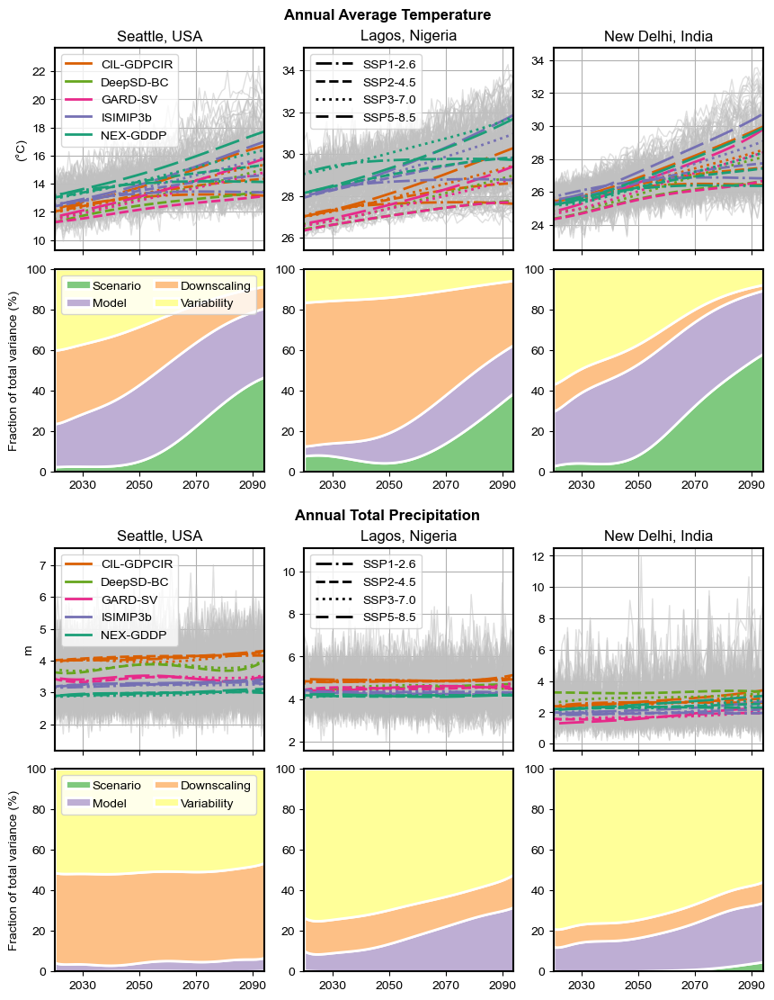

In [12]:
#################
#################
# Figure 1

plt.rcParams['font.size'] = 10
#################
#################
fig = plt.figure(constrained_layout=True, figsize=(8.5, 11))
subfigs = fig.subfigures(2, 1, wspace=0.07)

############################
# Annual average tas
############################
axs = subfigs[0].subplots(2, 3, sharex=True, height_ratios=[1,1])
subfigs[0].suptitle('Annual Average Temperature', fontweight='bold', fontsize=12)

metric = 'avg'
var_id = 'tas'

### Seattle, USA
lat, lon = 47.609722, -122.333056
df = pd.read_csv(data_path + 'seattle_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'seattle_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,0]
plot_timeseries(df, df_forced, 'Seattle, USA', u'(\N{DEGREE SIGN}C)', '', True, False, ax)

## UC
ax=axs[1,0]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', 'Fraction of total variance (%)', '', True, ax)

### Lagos, Nigeria
lat, lon = 6.455027, 3.384082
df = pd.read_csv(data_path + 'lagos_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'lagos_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,1]
plot_timeseries(df, df_forced, 'Lagos, Nigeria', '', '', False, True, ax)

## UC
ax=axs[1,1]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', '', '', False, ax)

### New Delhi, India
lat, lon = 28.613895, 77.209006

df = pd.read_csv(data_path + 'delhi_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'delhi_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,2]
plot_timeseries(df, df_forced, 'New Delhi, India', '', '', False, False, ax)

## UC
ax=axs[1,2]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', '', '', False, ax)

############################
# Annual average pr
############################
axs = subfigs[1].subplots(2, 3, sharex=True)
subfigs[1].suptitle('Annual Total Precipitation', fontweight='bold', fontsize=12)

metric = 'avg'
var_id = 'pr'

### Seattle, USA
lat, lon = 47.609722, -122.333056

df = pd.read_csv(data_path + 'seattle_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'seattle_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,0]
plot_timeseries(df, df_forced, 'Seattle, USA', 'm', '', True, False, ax)

## UC
ax=axs[1,0]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', 'Fraction of total variance (%)', '', True, ax)

### Lagos, Nigeria
lat, lon = 6.455027, 3.384082
df = pd.read_csv(data_path + 'lagos_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'lagos_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,1]
plot_timeseries(df, df_forced, 'Lagos, Nigeria', '', '', False, True, ax)

## UC
ax=axs[1,1]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', '', '', False, ax)

### New Delhi
lat, lon = 28.613895, 77.209006

df = pd.read_csv(data_path + 'delhi_' + metric + '_' + var_id + '.csv')
df_forced = pd.read_csv(data_path + 'delhi_' + metric + '_' + var_id + '_forced.csv')

## Timeseries
ax=axs[0,2]
plot_timeseries(df, df_forced, 'New Delhi, India', '', '', False, False, ax)

## UC
ax=axs[1,2]
plot_region_uc(metric, var_id, [lat,lon], True, True, 'hs09', '', '', '', False, ax)

plt.savefig('../figs/Figure1.png', dpi=600)

# Figure 2

### Plot

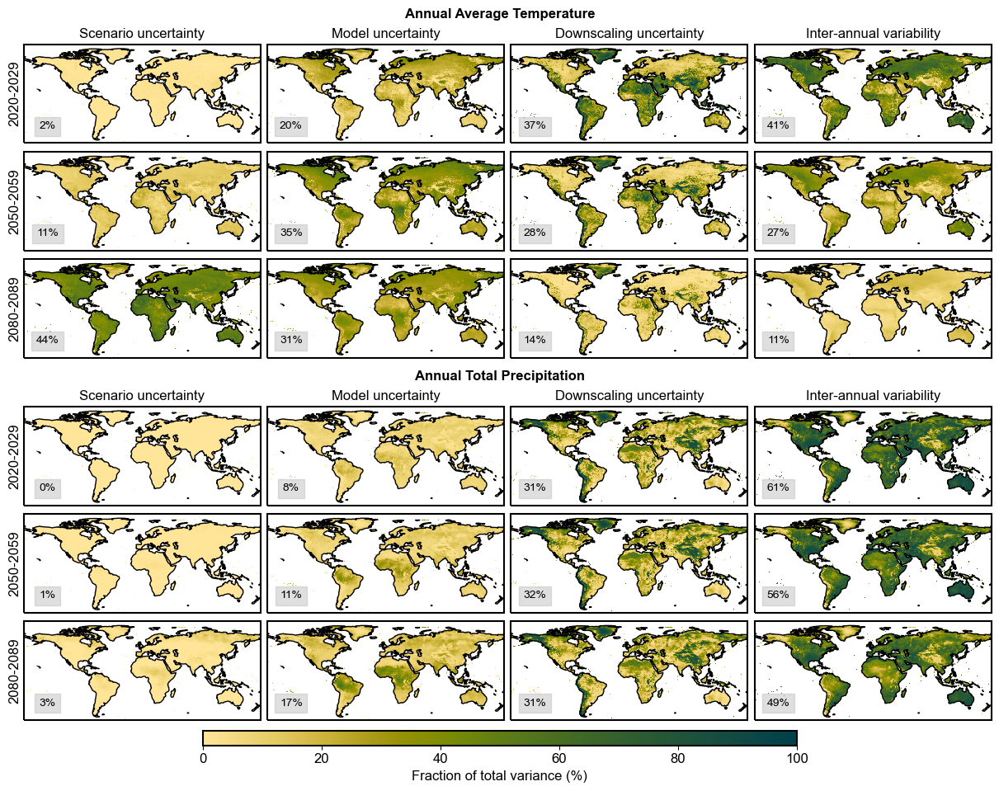

In [42]:
#################
#################
# Figure 2

plt.rcParams['font.size'] = 12
#################
#################
fig = plt.figure(figsize=(12, 9), constrained_layout=True)
subfigs = fig.subfigures(3, 1, height_ratios=[20,20,1])

############################
# Annual average tas
############################
axs = subfigs[0].subplots(3, 4, subplot_kw={'projection':ccrs.PlateCarree()})
subfigs[0].suptitle('Annual Average Temperature', fontweight='bold', fontsize=12)

metric = 'avg'
var_id = 'tas'

plot_map(metric=metric, var_id=var_id, 
         iav=True, const_iav=True,
         poly_response=True, scenario_id='hs09',
         axs=axs, fig=subfigs[0],
         cbar=False, title=False)

############################
# Annual average pr
############################
axs = subfigs[1].subplots(3, 4, subplot_kw={'projection':ccrs.PlateCarree()})
subfigs[1].suptitle('Annual Total Precipitation', fontweight='bold', fontsize=12)

metric = 'avg'
var_id = 'pr'

plot_map(metric=metric, var_id=var_id, 
         iav=True, const_iav=True,
         poly_response=True, scenario_id='hs09',
         axs=axs, fig=subfigs[1],
         cbar=False, title=False)

################
# Colorbar
################
cmap= bamako_map
norm = matplotlib.colors.Normalize(vmin=0, vmax=100) 
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm) 

cbar_ax = subfigs[2].add_axes([0.2, 0.1, 0.6, 0.8])
cbar = subfigs[2].colorbar(sm, cax=cbar_ax,
                    orientation='horizontal',
                    label='Fraction of total variance (%)')

plt.savefig('../figs/Figure2.png', dpi=600)
# plt.show()

# UC plots with IAV

## Annual averages

### Tas

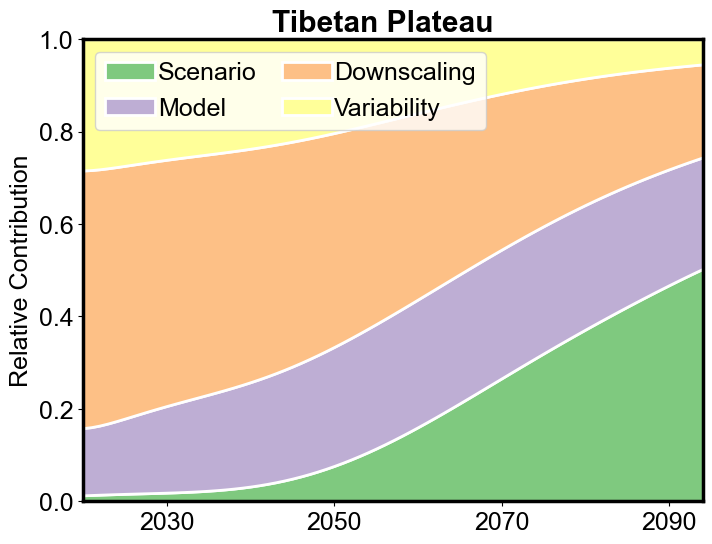

In [9]:
plot_region(metric='avg', var_id='tas',
            region='TIB', region_str='TIB',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Tibetan Plateau', store=True)

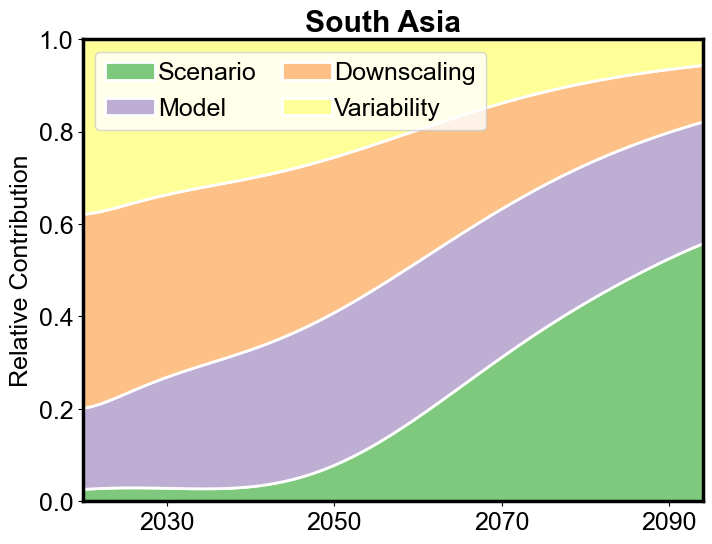

In [8]:
plot_region(metric='avg', var_id='tas',
            region='SAS', region_str='SAS',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='South Asia', store=True)

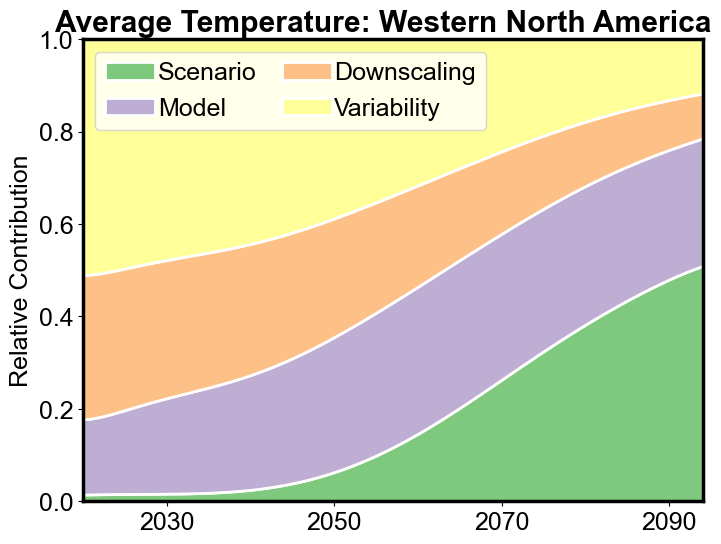

In [20]:
plot_region(metric='avg', var_id='tas',
            region='WNA', region_str='WNA',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Average Temperature: Western North America', store=True)

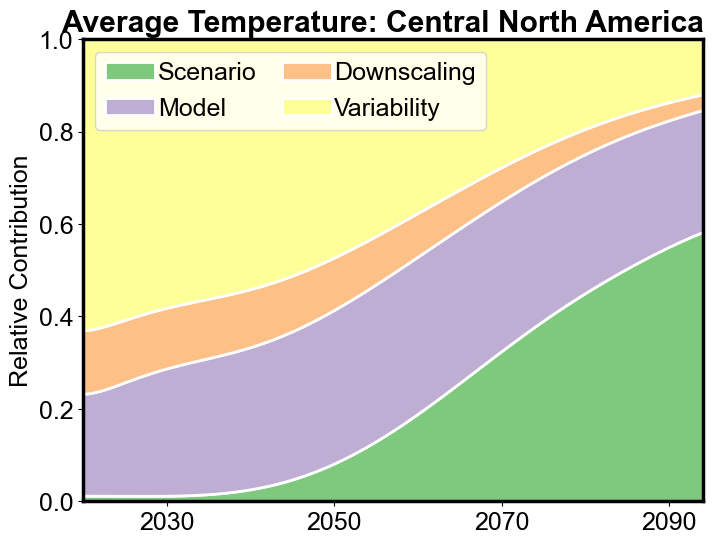

In [19]:
plot_region(metric='avg', var_id='tas',
            region='CNA', region_str='CNA',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Average Temperature: Central North America', store=True)

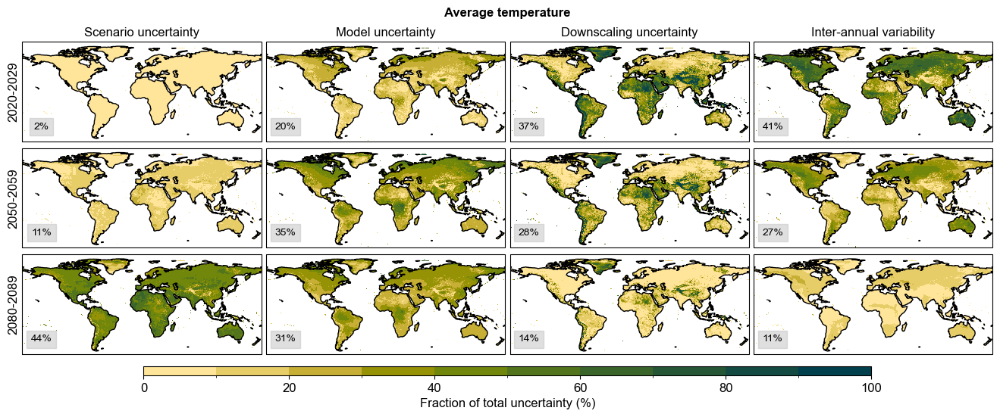

In [5]:
# constant iav
plot_map(metric='avg', var_id='tas', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Average temperature', store=True)

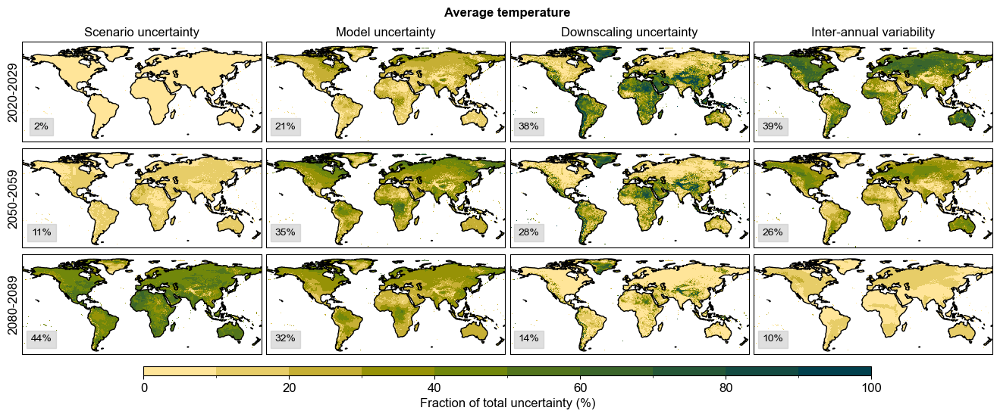

In [6]:
# non-const iav
plot_map(metric='avg', var_id='tas', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Average temperature', store=True)

### Precip

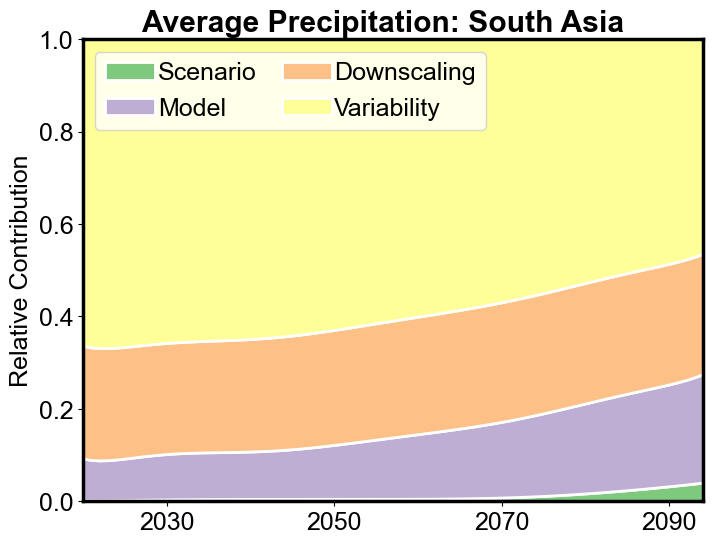

In [17]:
plot_region(metric='avg', var_id='pr',
            region='SAS', region_str='SAS',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Average Precipitation: South Asia', store=True)

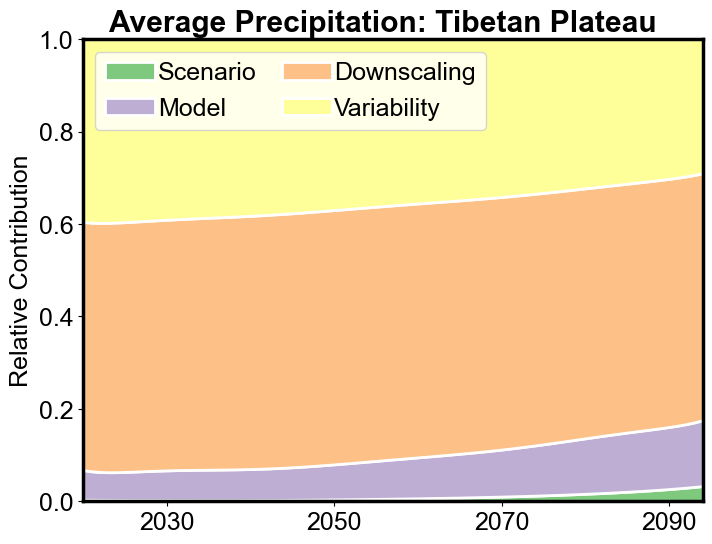

In [18]:
plot_region(metric='avg', var_id='pr',
            region='TIB', region_str='TIB',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Average Precipitation: Tibetan Plateau', store=True)

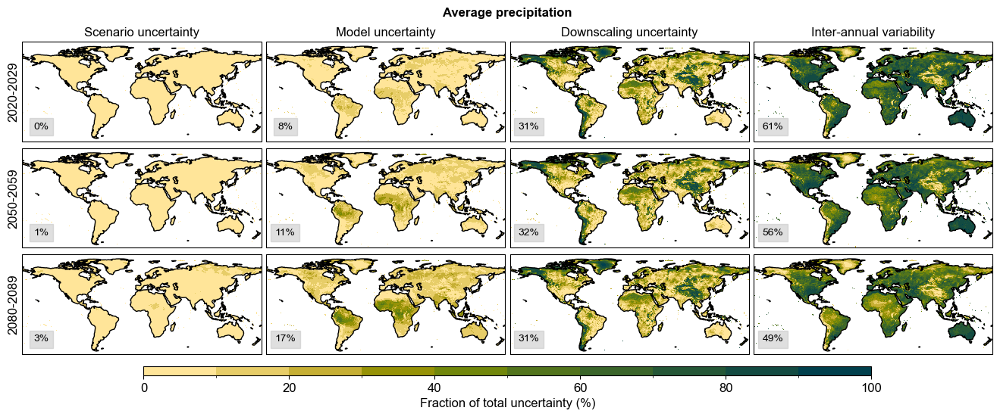

In [9]:
# constant iav
plot_map(metric='avg', var_id='pr', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Average precipitation', store=True)

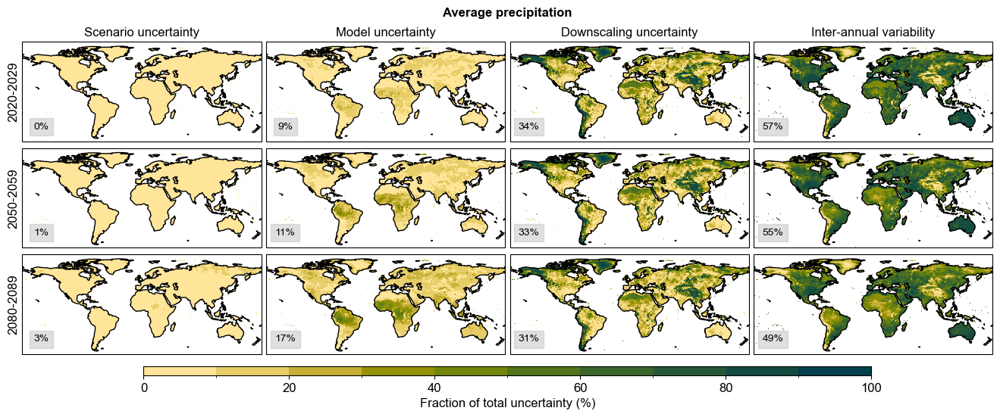

In [10]:
# non-constant iav
plot_map(metric='avg', var_id='pr', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Average precipitation', store=True)

## 1-day maxs

### Tasmax

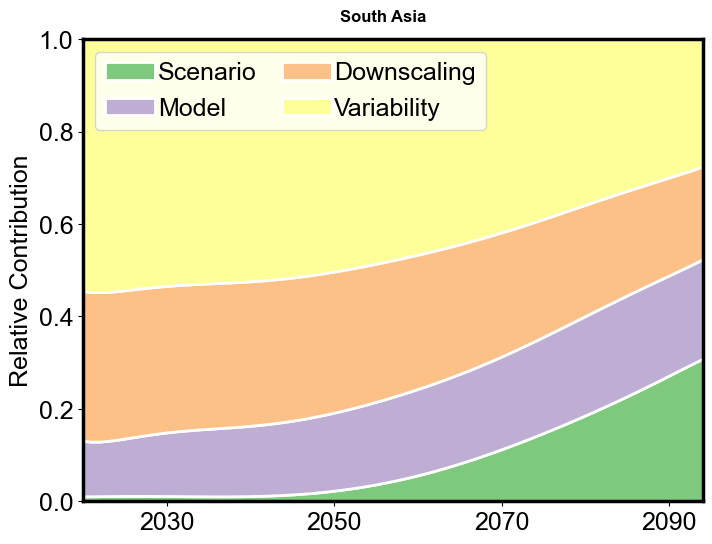

In [6]:
plot_region(metric='max', var_id='tasmax',
            region='SAS', region_str='SAS',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='South Asia', store=True)

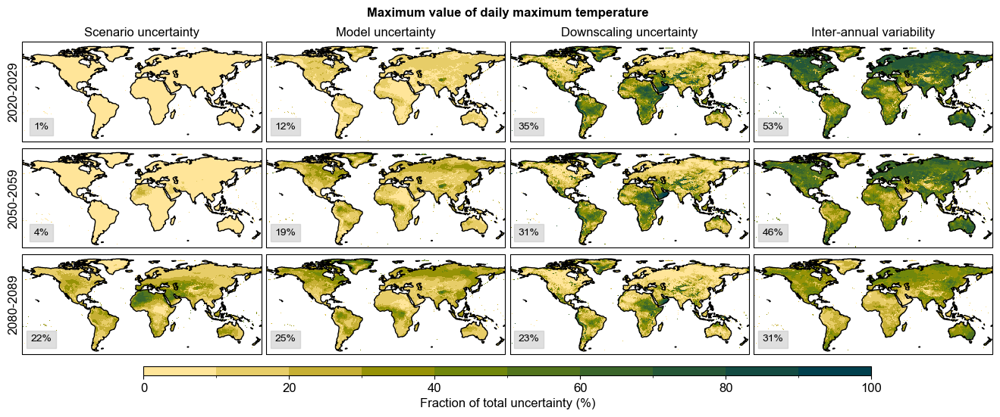

In [11]:
# constant iav
plot_map(metric='max', var_id='tasmax', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Maximum value of daily maximum temperature', store=True)

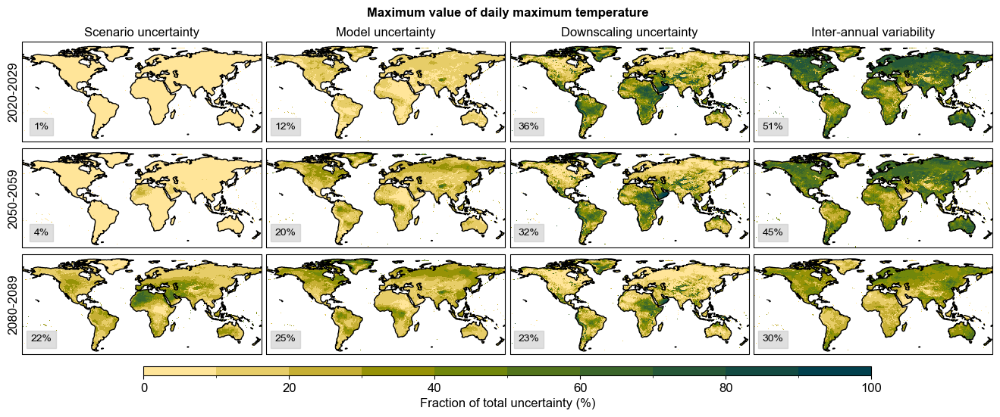

In [12]:
# non-constant iav
plot_map(metric='max', var_id='tasmax', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Maximum value of daily maximum temperature', store=True)

### Precip

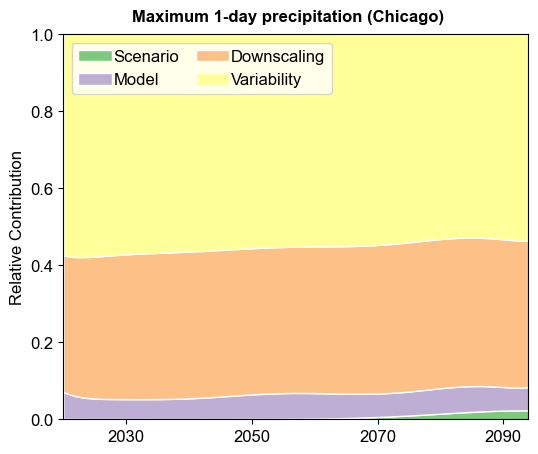

In [5]:
plot_region(metric='max', var_id='pr',
            region=[41.88, -87.68], region_str='Chicago',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Maximum 1-day precipitation (Chicago)', store=True)

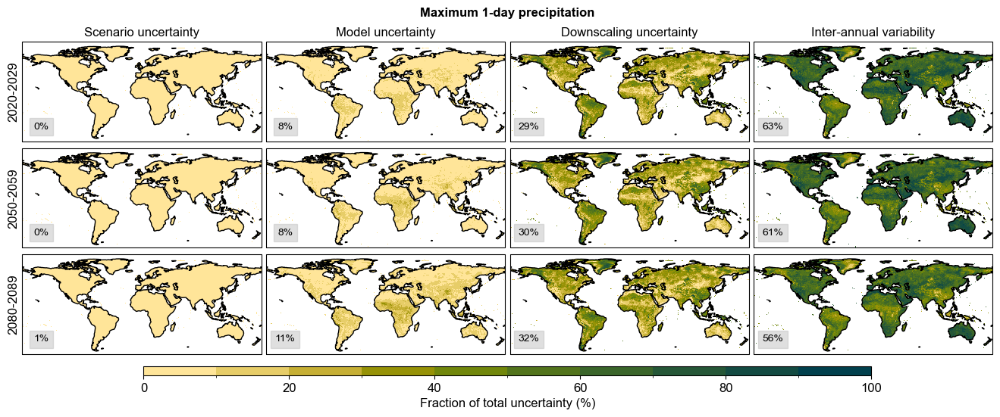

In [14]:
# constant iav
plot_map(metric='max', var_id='pr', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Maximum 1-day precipitation', store=True)

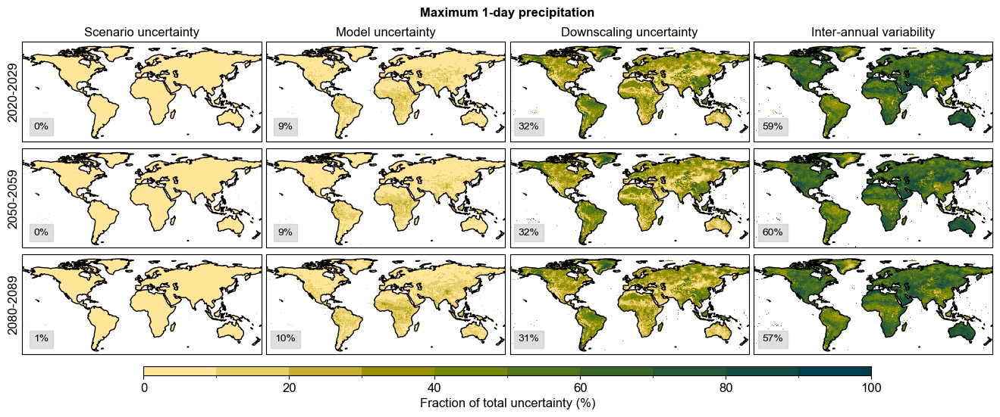

In [15]:
# non-constant iav
plot_map(metric='max', var_id='pr', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Maximum 1-day precipitation', store=True)

## 5-day max (pr)

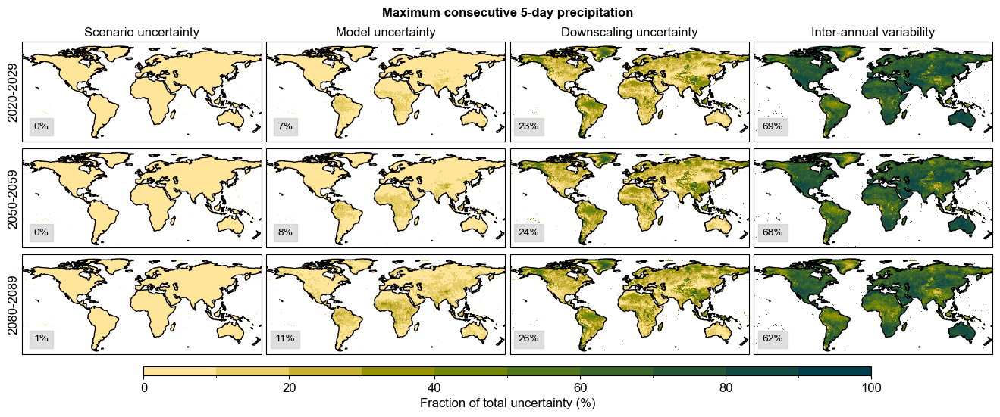

In [16]:
# constant iav
plot_map(metric='max5d', var_id='RX5day', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Maximum consecutive 5-day precipitation', store=True)

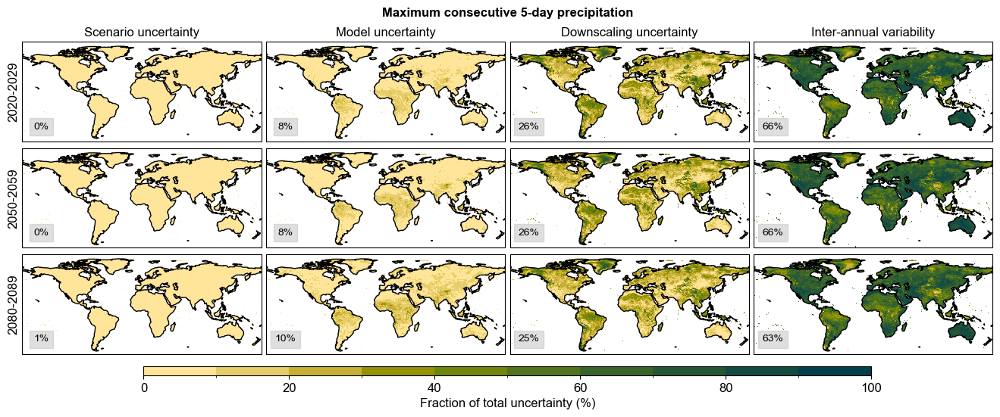

In [17]:
# non-constant iav
plot_map(metric='max5d', var_id='RX5day', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Maximum consecutive 5-day precipitation', store=True)

## Dry days

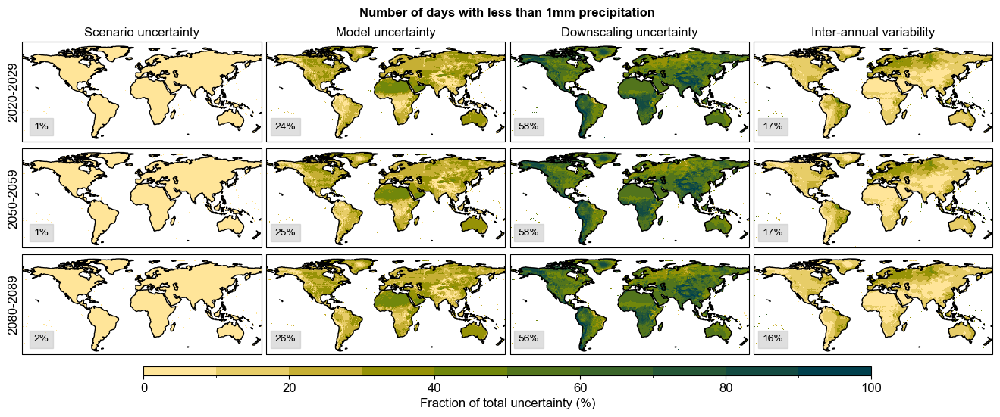

In [18]:
# constant iav
plot_map(metric='dry', var_id='count_lt_1', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Number of days with less than 1mm precipitation', store=True)

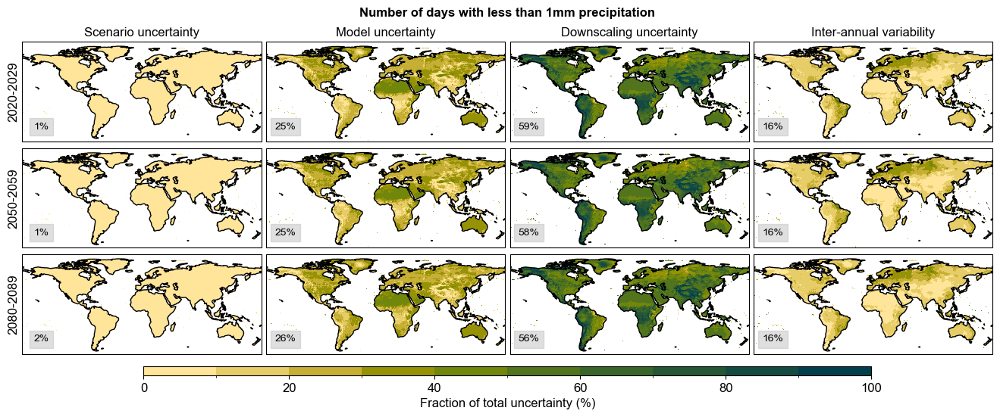

In [19]:
# non-constant iav
plot_map(metric='dry', var_id='count_lt_1', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Number of days with less than 1mm precipitation', store=True)

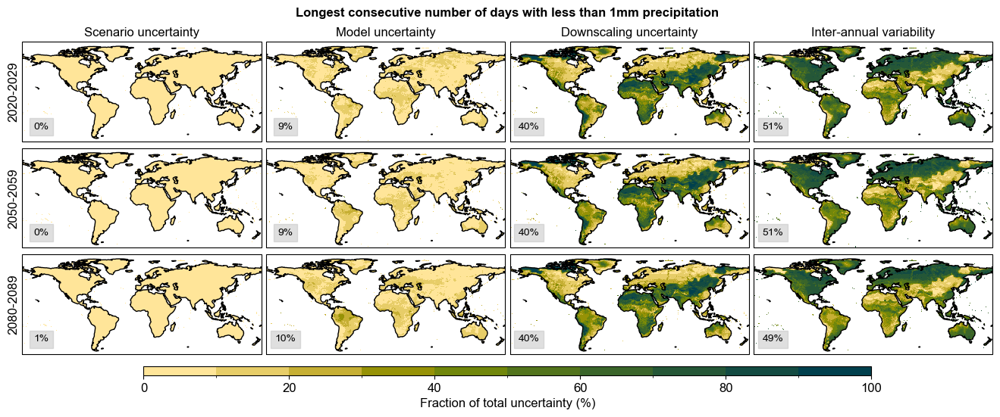

In [29]:
# constant iav
plot_map(metric='dry', var_id='streak_lt_1', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days with less than 1mm precipitation', store=True)

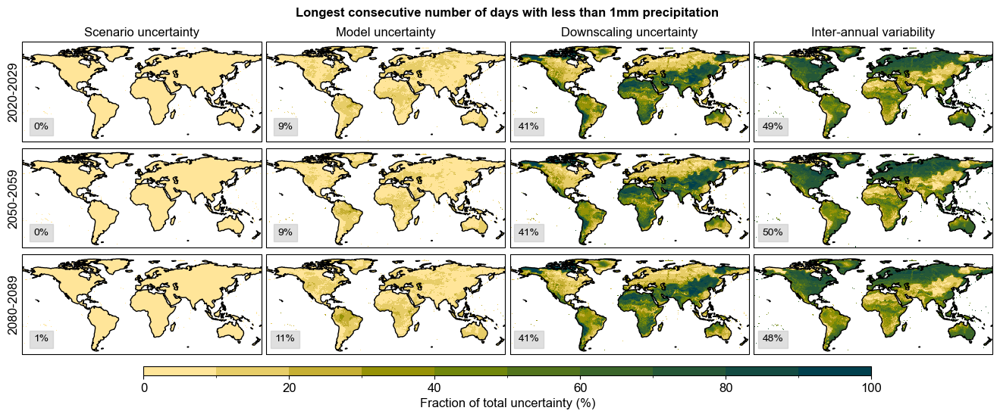

In [28]:
# non-constant iav
plot_map(metric='dry', var_id='streak_lt_1', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days with less than 1mm precipitation', store=True)

## Hot days

### Tasmax q99 GMFD

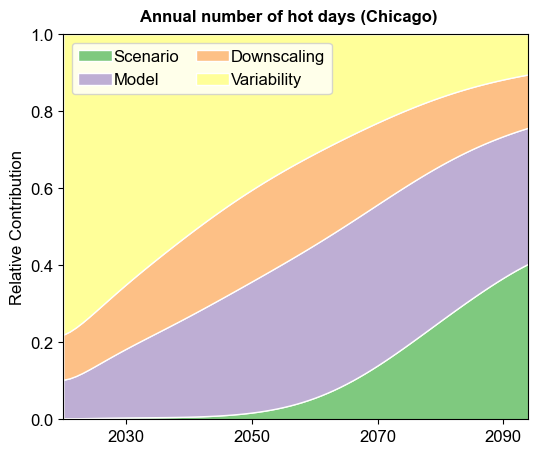

In [7]:
plot_region(metric='hot', var_id='tasmax_q99gmfd_count',
            region=[41.88, -87.68], region_str='Chicago',
            iav=True, poly_response=True, scenario_id='hs09', 
            title='Annual number of hot days (Chicago)', store=True)

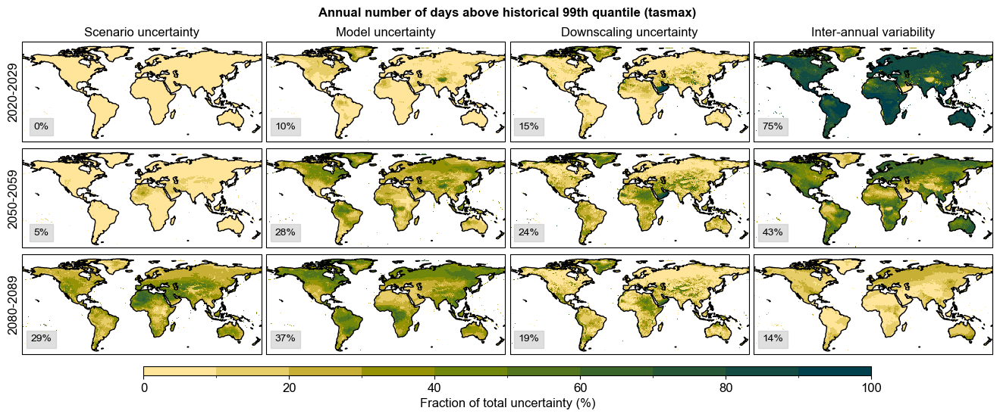

In [25]:
# constant iav
plot_map(metric='hot', var_id='tasmax_q99gmfd_count', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (tasmax)', store=True)

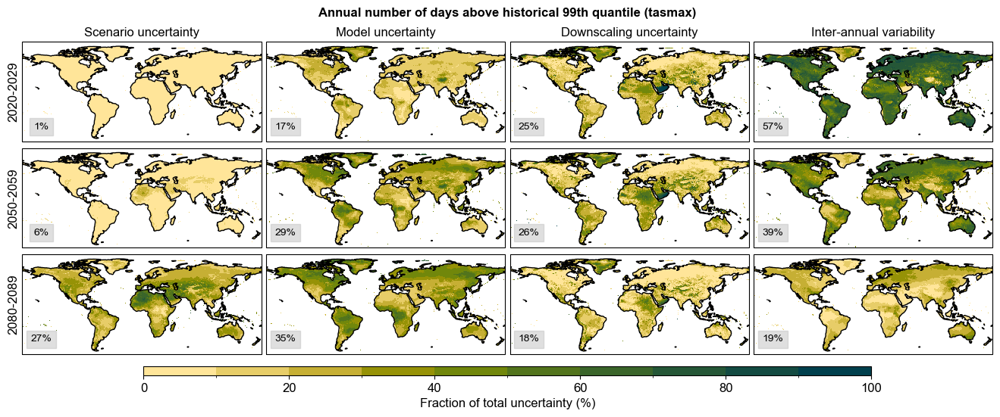

In [24]:
# non-constant iav
plot_map(metric='hot', var_id='tasmax_q99gmfd_count', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (tasmax)', store=True)

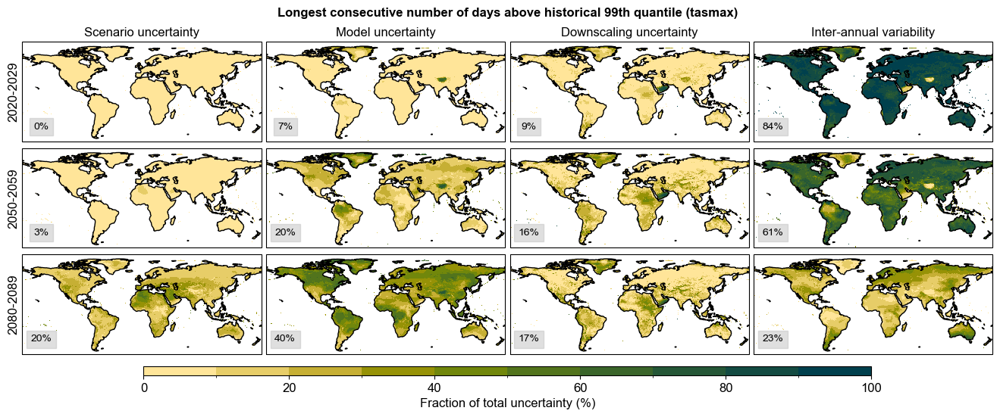

In [26]:
# constant iav
plot_map(metric='hot', var_id='tasmax_q99gmfd_streak', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days above historical 99th quantile (tasmax)', store=True)

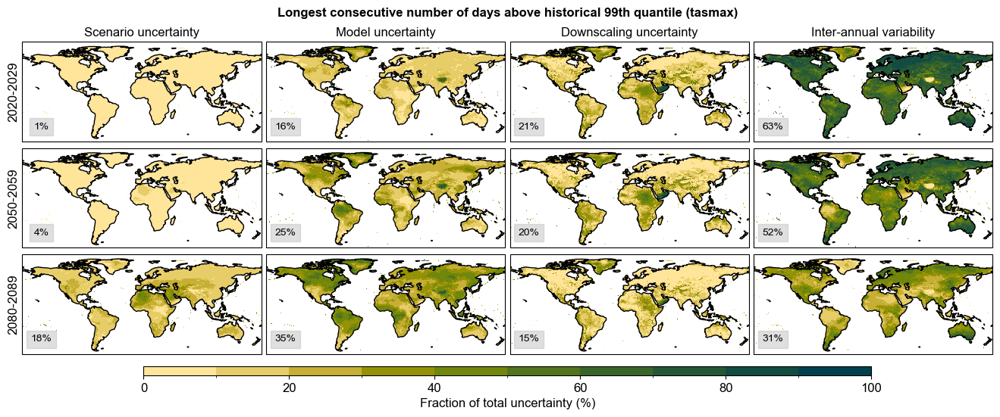

In [27]:
# non-constant iav
plot_map(metric='hot', var_id='tasmax_q99gmfd_streak', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days above historical 99th quantile (tasmax)', store=True)

### Tasmax rp10 GMFD

### Tas q99 GMFD

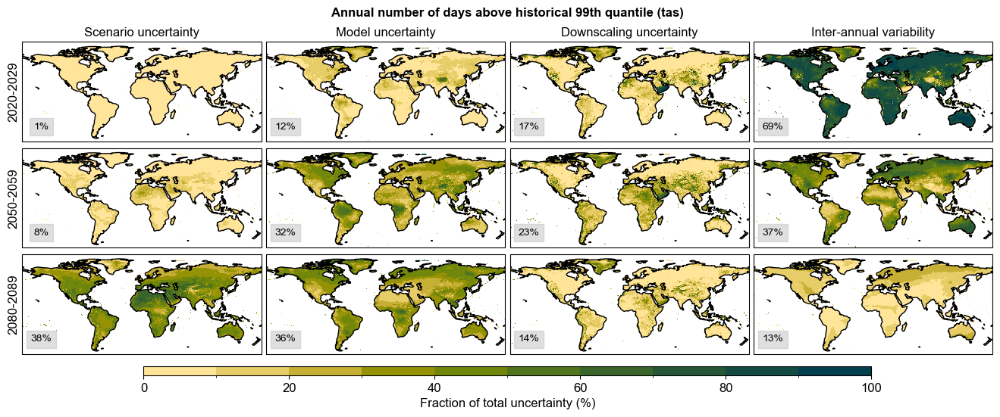

In [30]:
# constant iav
plot_map(metric='hot', var_id='tas_q99gmfd_count', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (tas)', store=True)

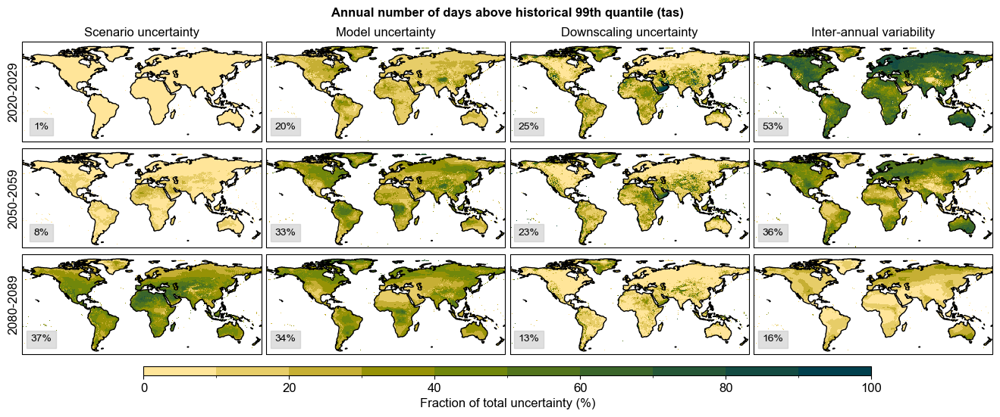

In [31]:
# non-constant iav
plot_map(metric='hot', var_id='tas_q99gmfd_count', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (tas)', store=True)

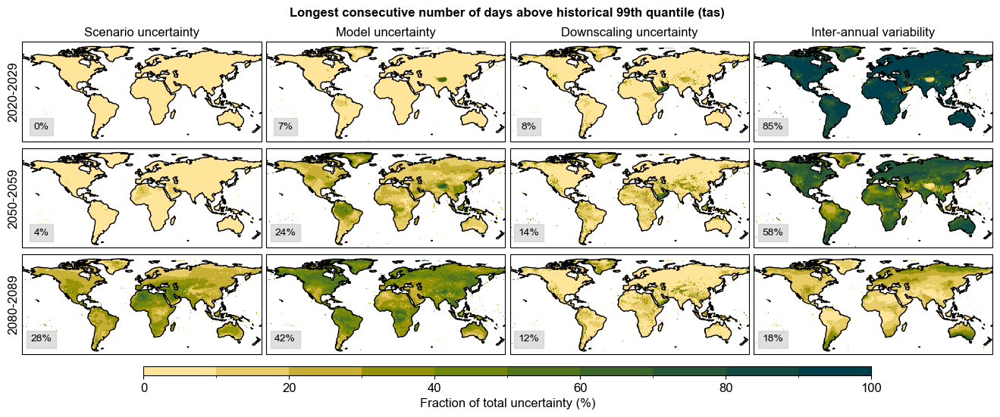

In [32]:
# constant iav
plot_map(metric='hot', var_id='tas_q99gmfd_streak', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days above historical 99th quantile (tas)', store=True)

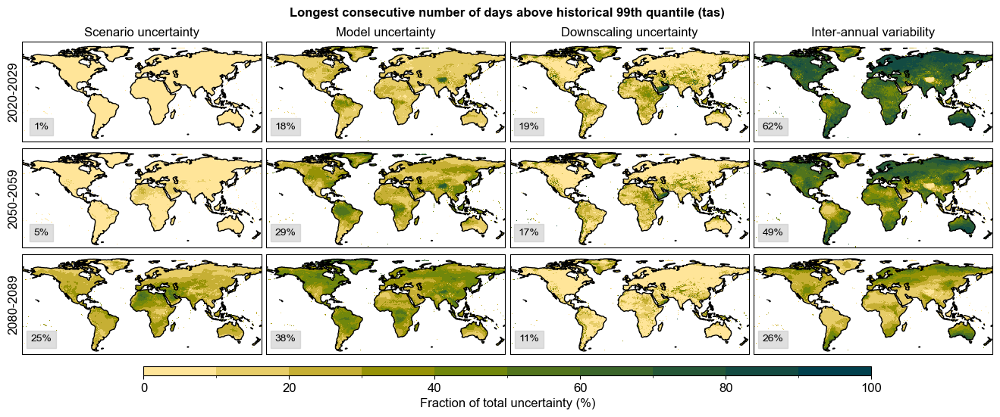

In [33]:
# non-constant iav
plot_map(metric='hot', var_id='tas_q99gmfd_streak', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Longest consecutive number of days above historical 99th quantile (tas)', store=True)

## Wet days

### GMFD q99

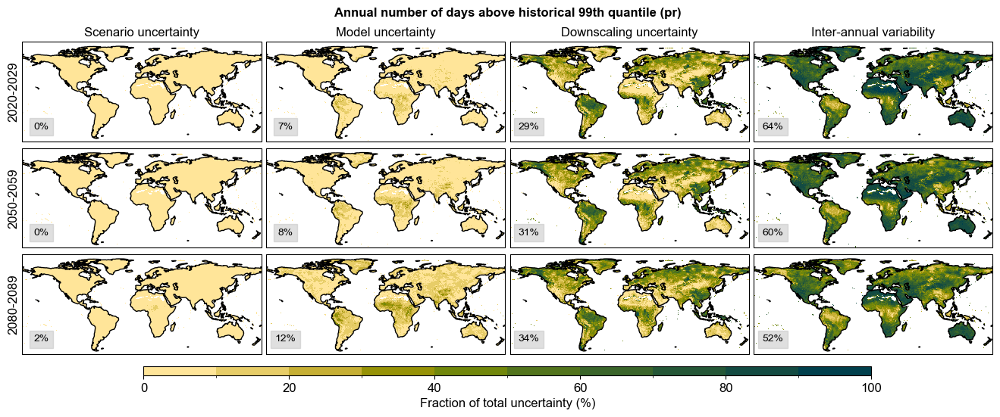

In [35]:
# constant iav
plot_map(metric='wet', var_id='pr_q99gmfd_count', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (pr)', store=True)

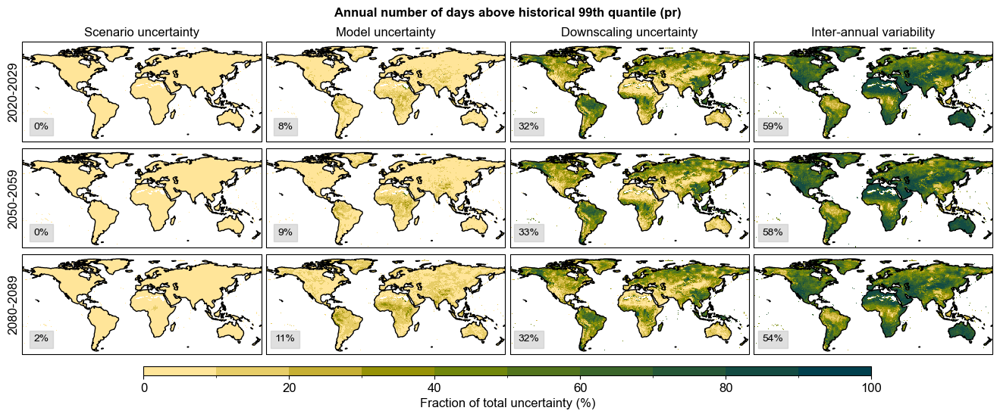

In [34]:
# non-constant iav
plot_map(metric='wet', var_id='pr_q99gmfd_count', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Annual number of days above historical 99th quantile (pr)', store=True)

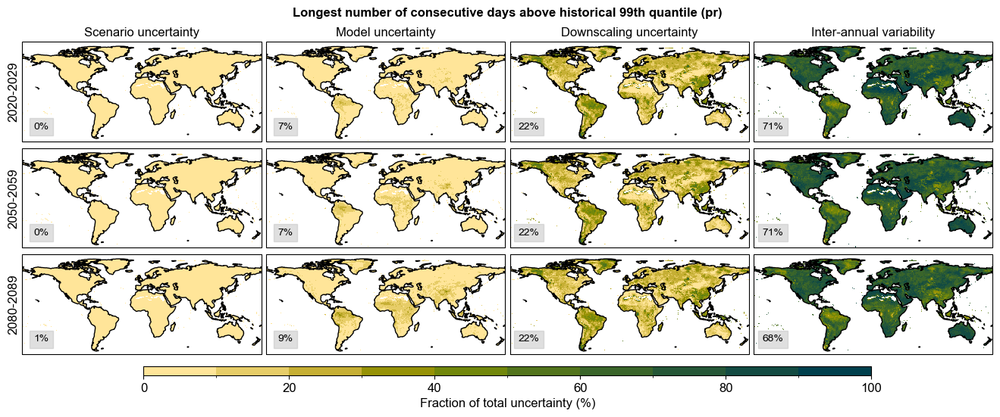

In [36]:
# constant iav
plot_map(metric='wet', var_id='pr_q99gmfd_streak', iav=True, const_iav=True, poly_response=True, scenario_id='hs09', title='Longest number of consecutive days above historical 99th quantile (pr)', store=True)

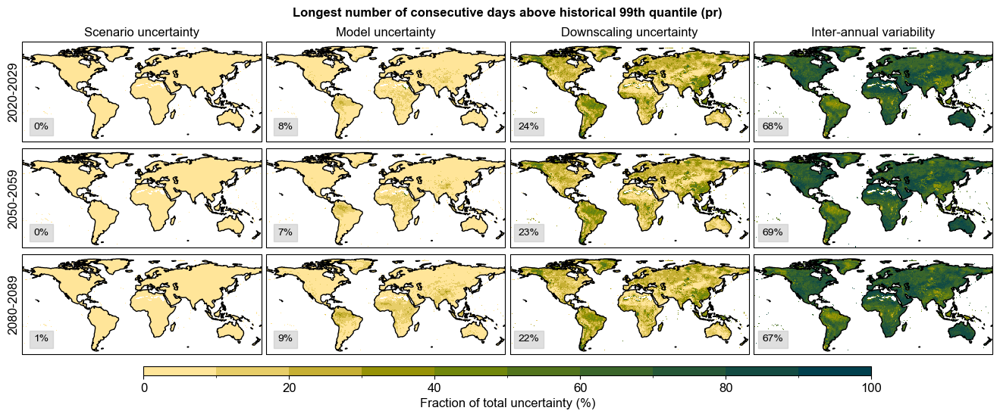

In [37]:
# non-constant iav
plot_map(metric='wet', var_id='pr_q99gmfd_streak', iav=True, const_iav=False, poly_response=True, scenario_id='hs09', title='Longest number of consecutive days above historical 99th quantile (pr)', store=True)

## UC plots without IAV

### Annual averages

### Annual maxs